# Homer Closest TSS per Gene Data and Heatmaps

2-6-26 Update

In [1]:
import pandas as pd
import numpy as np

In [2]:
cd GEO/RNA-seq/pca_ma_plots/final/

/vf/users/gallegosda/GEO/RNA-seq/pca_ma_plots/final


In [3]:
homerClosestTSSperGene_df = pd.read_csv("homer.closestTSS_perGene.csv", names=['geneName','var2','var3','var4','var5','var6','var7','var8','var9','var10','var11','var12','var13','var14','var15','var16','var17','var18','var19'])

In [4]:
homerClosestTSSperGene_df.head(3)

,geneName,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19
0,Car4,AW456718|Ca4,carbonic anhydrase 4,443,chr11,84957788,84958215,+,0,NaN,"intron (NM_007607, intron 1 of 7)",CpG,247,NM_007607,12351,Mm.1641,NM_007607,ENSMUSG00000000805,protein-coding
1,Ppp3ca,2900074D19Rik|CN|Caln|Calna|CnA,"protein phosphatase 3, catalytic subunit, alph...",1885,chr3,136670472,136671032,+,0,NaN,"5' UTR (NM_008913, exon 1 of 14)","5' UTR (NM_008913, exon 1 of 14)",686,NM_008913,19055,Mm.331389,NM_008913,ENSMUSG00000028161,protein-coding
2,Nr5a1,Ad4BP|ELP|ELP-3|Ftz-F1|Ftzf1|SF-1|SF1|STF-1,"nuclear receptor subfamily 5, group A, member 1",1550,chr2,38711554,38711989,+,0,NaN,"intron (NM_139051, intron 1 of 6)",CpG-8071,463,NM_001316687,26423,Mm.31387,NM_139051,ENSMUSG00000026751,protein-coding


In [5]:
allMouseGenes_df = pd.read_csv("all_mouse_gene_ENSEMBL_IDs_and_gene_names.txt",names=['ensemblID','stableID','stableTranscript','transcriptV','geneName'],skiprows=1)

In [6]:
allMouseGenes_df

,ensemblID,stableID,stableTranscript,transcriptV,geneName
0,ENSMUSG00000064336,ENSMUSG00000064336.1,ENSMUST00000082387,ENSMUST00000082387.1,mt-Tf
1,ENSMUSG00000064337,ENSMUSG00000064337.1,ENSMUST00000082388,ENSMUST00000082388.1,mt-Rnr1
2,ENSMUSG00000064338,ENSMUSG00000064338.1,ENSMUST00000082389,ENSMUST00000082389.1,mt-Tv
3,ENSMUSG00000064339,ENSMUSG00000064339.1,ENSMUST00000082390,ENSMUST00000082390.1,mt-Rnr2
4,ENSMUSG00000064340,ENSMUSG00000064340.1,ENSMUST00000082391,ENSMUST00000082391.1,mt-Tl1
...,...,...,...,...,...
278391,ENSMUSG00000026833,ENSMUSG00000026833.19,ENSMUST00000152415,ENSMUST00000152415.2,Olfm1
278392,ENSMUSG00000026833,ENSMUSG00000026833.19,ENSMUST00000113920,ENSMUST00000113920.8,Olfm1
278393,ENSMUSG00000026833,ENSMUSG00000026833.19,ENSMUST00000100244,ENSMUST00000100244.10,Olfm1
278394,ENSMUSG00000026833,ENSMUSG00000026833.19,ENSMUST00000102879,ENSMUST00000102879.4,Olfm1


In [7]:
# This function returns a df from a file like TEtranscripts_GRCm38_E10_777tm1d_2KO_males_vs_1WT_female_1WT_male_non_stranded_gene_TE_analysis.txt
# Receives .txt as input and returns df

def getGeneNameForTEtranscripts_txt(TEtranscripts_txtFile):
    df = pd.read_csv(TEtranscripts_txtFile, sep='\t',index_col=False,names=['ensemblID','baseMean','log2FoldChange','lfcSE','stat','pvalue','padj'],skiprows=1)
    
    df["ensemblID"] = (
        df["ensemblID"]
        .astype("string")          # pandas StringDtype (not plain str)
        .str.replace(r"\..*", "", regex=True)
    ) 
    
    df = df.merge(
        allMouseGenes_df[["geneName", "ensemblID"]],
        on="ensemblID",
        how="left"
    )
    
    df = df.drop_duplicates()

    return df


In [8]:
# df = pd.read_csv("TEtranscripts_GRCm38_E10_777tm1d_2KO_males_vs_1WT_female_1WT_male_non_stranded_gene_TE_analysis.txt", sep='\t',index_col=False,names=['ensemblID','baseMean','log2FoldChange','lfcSE','stat','pvalue','padj'],skiprows=1)
# # print(df.head)

# # Rename the first column (at index 0)
# # df = df.rename(columns={df.columns[0]: 'ensemblID'})

# df["ensemblID"] = (
#     df["ensemblID"]
#     .astype("string")          # pandas StringDtype (not plain str)
#     .str.replace(r"\..*", "", regex=True)
# )

# # print(df.head)
# # df

# df = df.merge(
#     allMouseGenes_df[["geneName", "ensemblID"]],
#     on="ensemblID",
#     how="left"
# )

# df = df.drop_duplicates()

# df

In [9]:
mMEF_E15_aKOvWT_males_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mMEF_E15_777KO_tm1a_vs_WT_males_non_stranded_gene_TE_analysis.txt")

In [10]:
mMEF_E15_aKOvWT_females_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mMEF_E15_777KO_tm1a_vs_WT_females_non_stranded_gene_TE_analysis.txt")

In [11]:
mMEF_E15_patientKIvE16WT_females_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mMEF_E15_777-R297W-KI_vs_E16_WT_females_non_stranded_gene_TE_analysis.txt")

In [12]:
mMEF_E15_patientKIvE15WT_males_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mMEF_E15_777-R297W-KI_vs_E15_WT_males_non_stranded_gene_TE_analysis.txt")

In [13]:
mMEF_E13_clusterKOvWT_males_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mMEF_E13_DUFKZFP_cluster_KO_vs_WT_males_non_stranded_gene_TE_analysis.txt")

In [14]:
mF9_OE_patientpCMV6vpSBmock_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mF9_OE_pCMV6_777-R297W-HA_vs_pSB_mock_non_stranded_gene_TE_analysis.txt")

In [15]:
mF9_OE_777vpSBmock_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mF9_OE_pCMV6_777-HA_vs_pSB_mock_non_stranded_gene_TE_analysis.txt")

In [16]:
mESC_KO_EGFPexcisedvWT_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_mESC_R1_777KO_EGFP_excised_vs_WT_non_stranded_gene_TE_analysis.txt")

In [17]:
E8_aKOvWT_males_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_E8_777tm1a_KO_vs_WT_males_non_stranded_gene_TE_analysis.txt")

In [18]:
E8_aKOvWT_females_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_E8_777tm1a_KO_vs_WT_females_non_stranded_gene_TE_analysis.txt")

In [19]:
E10_dKOvWT_mf_df = getGeneNameForTEtranscripts_txt("TEtranscripts_GRCm38_E10_777tm1d_2KO_males_vs_1WT_female_1WT_male_non_stranded_gene_TE_analysis.txt")

In [20]:
mMEF_E15_aKOvWT_males_df.loc[mMEF_E15_aKOvWT_males_df['geneName']=='Acadl']

,ensemblID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneName
29030,ENSMUSG00000026003,1309.852514,0.029923,0.222277,0.13462,0.892913,0.981316,Acadl


In [21]:
mF9_OE_patientpCMV6vpSBmock_df.loc[mF9_OE_patientpCMV6vpSBmock_df['geneName']=='Acadl']

,ensemblID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneName
28735,ENSMUSG00000026003,3563.687259,-0.059661,0.074049,-0.805698,0.420417,0.999695,Acadl


In [22]:
mMEF_E15_patientKIvE16WT_females_df.loc[mMEF_E15_patientKIvE16WT_females_df['geneName']=='Morc4']

,ensemblID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneName
46493,ENSMUSG00000031434,840.227535,-1.272542,0.2929,-4.344633,0.000014,0.000212,Morc4


In [23]:
mMEF_E13_clusterKOvWT_males_df.loc[mMEF_E13_clusterKOvWT_males_df['geneName']=='Lrrc7']

,ensemblID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneName
36227,ENSMUSG00000028176,7.217716,0.354474,2.071381,0.171129,0.864122,0.999969,Lrrc7
120807,ENSMUSG00000104597,12.254025,-0.081791,1.531621,-0.053402,0.957412,0.999969,Lrrc7


In [24]:
mMEF_E15_aKOvWT_males_df

,ensemblID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneName
0,ENSMUSG00000000001,3123.590474,-0.012997,0.225714,-0.057583,9.540809e-01,9.836959e-01,Gnai3
1,ENSMUSG00000000028,350.340286,0.305006,0.279101,1.092816,2.744747e-01,7.623687e-01,Cdc45
5,ENSMUSG00000000031,21314.408858,-2.401234,0.274553,-8.745967,2.211141e-18,2.637364e-15,H19
26,ENSMUSG00000000037,19.745926,-1.137889,0.799598,-1.423075,1.547143e-01,6.026881e-01,Scml2
35,ENSMUSG00000000049,39.011157,-0.248033,0.586197,-0.423122,6.722060e-01,9.259562e-01,Apoh
...,...,...,...,...,...,...,...,...
128928,ZP3AR:Satellite:Satellite,626.975354,-0.610377,0.323508,-1.886742,5.919505e-02,3.684686e-01,NaN
128929,Zaphod2:hAT-Tip100:DNA,0.912345,3.191318,3.832658,0.832664,4.050341e-01,8.648981e-01,NaN
128930,Zaphod3:hAT-Tip100:DNA,16.753550,-0.781496,0.890346,-0.877744,3.800825e-01,8.518641e-01,NaN
128931,Zaphod:hAT-Tip100:DNA,13.651162,-0.571859,0.995754,-0.574297,5.657667e-01,9.105791e-01,NaN


In [25]:
homerClosestTSSperGene_GeneNamesOnly_df = homerClosestTSSperGene_df[['geneName']]


In [26]:
# Test join
df = homerClosestTSSperGene_GeneNamesOnly_df.merge(
    mMEF_E15_aKOvWT_males_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)

In [27]:
# Rename a specific column 'B' to 'New_B'
df = df.rename(columns={'log2FoldChange': 'mMEF_E15_aKOvWT_males_log2FC'})

In [28]:
df

,geneName,mMEF_E15_aKOvWT_males_log2FC
0,Car4,1.339315
1,Ppp3ca,0.406624
2,Nr5a1,-4.865477
3,Bbs5,0.998045
4,Ppp3cc,0.358830
...,...,...
2798,Rell1,0.260231
2799,Car2,-1.666589
2800,Efna2,-0.752565
2801,Rell2,0.210392


In [29]:
# More joins
df = df.merge(
    mMEF_E15_aKOvWT_females_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mMEF_E15_aKOvWT_females_log2FC'})

df = df.merge(
    mMEF_E15_patientKIvE16WT_females_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mMEF_E15_patientKIvE16WT_females_log2FC'})


df = df.merge(
    mMEF_E15_patientKIvE15WT_males_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mMEF_E15_patientKIvE15WT_males_log2FC'})


df = df.merge(
    mMEF_E13_clusterKOvWT_males_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mMEF_E13_clusterKOvWT_males_log2FC'})


df = df.merge(
    mF9_OE_patientpCMV6vpSBmock_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mF9_OE_patientpCMV6vpSBmock_log2FC'})

df = df.merge(
    mF9_OE_777vpSBmock_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mF9_OE_777vpSBmock_log2FC'})

df = df.merge(
    mESC_KO_EGFPexcisedvWT_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'mESC_KO_EGFPexcisedvWT_log2FC'})

df = df.merge(
    E8_aKOvWT_males_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'E8_aKOvWT_males_log2FC'})

df = df.merge(
    E8_aKOvWT_females_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'E8_aKOvWT_females_log2FC'})
# 
df = df.merge(
    E10_dKOvWT_mf_df[["geneName", "log2FoldChange"]],
    on="geneName",
    how="left"
)
df = df.rename(columns={'log2FoldChange': 'E10_dKOvWT_mf_log2FC'})



In [30]:
df

,geneName,mMEF_E15_aKOvWT_males_log2FC,mMEF_E15_aKOvWT_females_log2FC,mMEF_E15_patientKIvE16WT_females_log2FC,mMEF_E15_patientKIvE15WT_males_log2FC,mMEF_E13_clusterKOvWT_males_log2FC,mF9_OE_patientpCMV6vpSBmock_log2FC,mF9_OE_777vpSBmock_log2FC,mESC_KO_EGFPexcisedvWT_log2FC,E8_aKOvWT_males_log2FC,E8_aKOvWT_females_log2FC,E10_dKOvWT_mf_log2FC
0,Car4,1.339315,-1.011783,-3.589685,NaN,-3.683206,-1.305721,-0.273210,-0.489246,0.524201,0.194931,0.375135
1,Ppp3ca,0.406624,-0.104624,0.001710,0.450459,-0.276674,-0.118119,-0.211948,0.231611,-0.149899,-0.124822,0.226837
2,Nr5a1,-4.865477,1.510755,-3.627988,-4.042709,1.480193,0.222983,0.401732,0.104631,0.309612,1.176672,-0.184091
3,Bbs5,0.998045,0.012541,0.765101,0.823408,0.262260,-0.027248,-0.039019,-0.415166,0.031988,0.147180,-0.056199
4,Ppp3cc,0.358830,0.194157,0.157946,0.003984,0.298265,-0.048729,-0.261857,0.509793,0.209369,0.113688,0.548918
...,...,...,...,...,...,...,...,...,...,...,...,...
11299,Rell1,0.260231,0.282502,0.037566,-0.301917,0.371903,-0.111070,-0.219812,-0.082160,-0.033426,-0.008482,0.019051
11300,Car2,-1.666589,0.676888,0.011434,0.868281,-0.657800,0.102580,0.150735,-0.158000,0.132282,-0.062851,0.284113
11301,Efna2,-0.752565,0.018711,-1.173163,-1.734658,0.266176,-0.028690,0.064358,0.048713,-0.273028,-0.010901,-0.299740
11302,Rell2,0.210392,0.180841,0.070738,-0.472328,0.469701,0.032110,-0.152993,-0.254215,0.218178,0.336738,0.453236


In [31]:
df = df.drop_duplicates()

In [39]:
df.loc[df['geneName']=='Lrrc7']

,geneName,mMEF_E15_aKOvWT_males_log2FC,mMEF_E15_aKOvWT_females_log2FC,mMEF_E15_patientKIvE16WT_females_log2FC,mMEF_E15_patientKIvE15WT_males_log2FC,mMEF_E13_clusterKOvWT_males_log2FC,mF9_OE_patientpCMV6vpSBmock_log2FC,mF9_OE_777vpSBmock_log2FC,mESC_KO_EGFPexcisedvWT_log2FC,E8_aKOvWT_males_log2FC,E8_aKOvWT_females_log2FC,E10_dKOvWT_mf_log2FC
409,Lrrc7,-1.919093,-0.668156,-0.992237,-1.742988,0.354474,0.663596,0.29079,0.226616,0.015112,-0.003619,1.194863
410,Lrrc7,-1.919093,-0.668156,-0.992237,-1.742988,0.354474,0.663596,0.29079,0.226616,0.015112,-0.003619,-0.354013
411,Lrrc7,-1.919093,-0.668156,-0.992237,-1.742988,0.354474,0.663596,0.29079,0.226616,0.015112,-0.126133,1.194863
412,Lrrc7,-1.919093,-0.668156,-0.992237,-1.742988,0.354474,0.663596,0.29079,0.226616,0.015112,-0.126133,-0.354013
413,Lrrc7,-1.919093,-0.668156,-0.992237,-1.742988,0.354474,0.663596,0.29079,0.226616,-0.112248,-0.003619,1.194863
...,...,...,...,...,...,...,...,...,...,...,...,...
660,Lrrc7,0.027423,-0.210362,0.229261,-0.060135,-0.081791,0.663596,0.29079,0.226616,0.015112,-0.126133,-0.354013
661,Lrrc7,0.027423,-0.210362,0.229261,-0.060135,-0.081791,0.663596,0.29079,0.226616,-0.112248,-0.003619,1.194863
662,Lrrc7,0.027423,-0.210362,0.229261,-0.060135,-0.081791,0.663596,0.29079,0.226616,-0.112248,-0.003619,-0.354013
663,Lrrc7,0.027423,-0.210362,0.229261,-0.060135,-0.081791,0.663596,0.29079,0.226616,-0.112248,-0.126133,1.194863


In [33]:
# df.to_csv('homerClosestTSSperGene_allTEtranscripts_log2FC.csv',index=False)

## Heatmaps

In [34]:
homerClosestTSSperGene_df

,geneName,var2,var3,var4,var5,var6,var7,var8,var9,var10,var11,var12,var13,var14,var15,var16,var17,var18,var19
0,Car4,AW456718|Ca4,carbonic anhydrase 4,443,chr11,84957788,84958215,+,0,NaN,"intron (NM_007607, intron 1 of 7)",CpG,247,NM_007607,12351,Mm.1641,NM_007607,ENSMUSG00000000805,protein-coding
1,Ppp3ca,2900074D19Rik|CN|Caln|Calna|CnA,"protein phosphatase 3, catalytic subunit, alph...",1885,chr3,136670472,136671032,+,0,NaN,"5' UTR (NM_008913, exon 1 of 14)","5' UTR (NM_008913, exon 1 of 14)",686,NM_008913,19055,Mm.331389,NM_008913,ENSMUSG00000028161,protein-coding
2,Nr5a1,Ad4BP|ELP|ELP-3|Ftz-F1|Ftzf1|SF-1|SF1|STF-1,"nuclear receptor subfamily 5, group A, member 1",1550,chr2,38711554,38711989,+,0,NaN,"intron (NM_139051, intron 1 of 6)",CpG-8071,463,NM_001316687,26423,Mm.31387,NM_139051,ENSMUSG00000026751,protein-coding
3,Bbs5,1700049I01Rik|2700023J09Rik,Bardet-Biedl syndrome 5 (human),1569,chr2,69647067,69647652,+,0,NaN,"intron (NM_028284, intron 1 of 11)",CpG,188,NM_001362706,72569,Mm.252136,NM_028284,ENSMUSG00000063145,protein-coding
4,Ppp3cc,Calnc|PP2BA gamma,"protein phosphatase 3, catalytic subunit, gamm...",922,chr14,70289129,70289377,+,0,NaN,"5' UTR (NM_001360229, exon 1 of 13)","5' UTR (NM_001360229, exon 1 of 13)",244,NM_001304992,19057,Mm.439683,NM_008915,ENSMUSG00000022092,protein-coding
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2793,Rell1,AA536743,RELT-like 1,2181,chr5,63968509,63968817,+,0,NaN,"exon (NM_145923, exon 1 of 7)","exon (NM_145923, exon 1 of 7)",234,NM_145923,100532,Mm.243632,NM_145923,ENSMUSG00000047881,protein-coding
2794,Car2,AI131712|CAII|Ca2|Car-2|Ltw-5|Lvtw-5,carbonic anhydrase 2,1743,chr3,14886255,14887104,+,0,NaN,"5' UTR (NM_009801, exon 1 of 7)","5' UTR (NM_009801, exon 1 of 7)",391,NM_009801,12349,Mm.1186,NM_009801,ENSMUSG00000027562,protein-coding
2795,Efna2,CEK7L|Elf1|Epl6|Eplg6|Lerk6,ephrin A2,247,chr10,80190330,80190907,+,0,NaN,TTS (NM_007909),TTS (NM_007909),11136,NM_007909,13637,Mm.1478,NM_007909,ENSMUSG00000003070,protein-coding
2796,Rell2,4631403P03Rik|ependolin,RELT-like 2,1341,chr18,37955007,37956344,+,0,NaN,promoter-TSS (NM_010411),promoter-TSS (NM_010411),116,NM_153793,225392,Mm.233516,NM_153793,ENSMUSG00000044024,protein-coding


In [35]:
boolean = not homerClosestTSSperGene_df["geneName"].is_unique      # True (credit to @Carsten)

In [36]:
boolean

False

In [40]:
# df = your dataframe

# 1) identify log2FC columns
log2fc_cols = [c for c in df.columns if c.endswith("_log2FC")]

# 2) define threshold for a "strong" effect
#    set to 0 if you want ANY non-zero effect to count
threshold = 0.0

# absolute values
abs_fc = df[log2fc_cols].abs()

# 3) scoring
df_scored = df.copy()
df_scored["_n_strong"] = (abs_fc > threshold).sum(axis=1)
df_scored["_sum_abs"] = abs_fc.sum(axis=1)
df_scored["_max_abs"] = abs_fc.max(axis=1)  # optional tie-breaker

# 4) pick best row per gene
df_best = (
    df_scored
    .sort_values(
        ["geneName", "_n_strong", "_sum_abs", "_max_abs"],
        ascending=[True, False, False, False]
    )
    .drop_duplicates("geneName", keep="first")
    .drop(columns=["_n_strong", "_sum_abs", "_max_abs"])
)

# df_best now has exactly one row per geneName


In [41]:
df_best

,geneName,mMEF_E15_aKOvWT_males_log2FC,mMEF_E15_aKOvWT_females_log2FC,mMEF_E15_patientKIvE16WT_females_log2FC,mMEF_E15_patientKIvE15WT_males_log2FC,mMEF_E13_clusterKOvWT_males_log2FC,mF9_OE_patientpCMV6vpSBmock_log2FC,mF9_OE_777vpSBmock_log2FC,mESC_KO_EGFPexcisedvWT_log2FC,E8_aKOvWT_males_log2FC,E8_aKOvWT_females_log2FC,E10_dKOvWT_mf_log2FC
722,0610010K14Rik,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,0610039H22Rik,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
936,1-Mar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6536,1010001N08Rik,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6639,11-Mar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1285,Zswim6,-0.096579,-0.039212,0.521084,-0.052862,-0.474079,-0.035291,-0.238596,0.359563,-0.165467,-0.040583,0.131327
6943,Zxda,3.780557,-1.040589,-1.336613,0.625054,NaN,-4.390570,0.865508,NaN,-0.308997,-0.161825,-0.232630
6946,Zxdb,-0.291974,-0.261189,-0.222524,-0.098669,-0.063877,-0.062832,-0.114814,0.251703,-0.065300,0.016925,-0.000288
6173,Zyg11a,1.550915,1.519862,-1.048086,0.019624,-0.378368,-0.039749,-0.157374,0.501974,1.434094,1.037042,1.620861


In [42]:
# make geneName an ordered categorical using the other dataframe
order = homerClosestTSSperGene_df["geneName"]

df_sorted = (
    df_best.assign(
        geneName=pd.Categorical(df_best["geneName"], categories=order, ordered=True)
    )
    .sort_values("geneName")
)


In [48]:
df_sorted

,geneName,mMEF_E15_aKOvWT_males_log2FC,mMEF_E15_aKOvWT_females_log2FC,mMEF_E15_patientKIvE16WT_females_log2FC,mMEF_E15_patientKIvE15WT_males_log2FC,mMEF_E13_clusterKOvWT_males_log2FC,mF9_OE_patientpCMV6vpSBmock_log2FC,mF9_OE_777vpSBmock_log2FC,mESC_KO_EGFPexcisedvWT_log2FC,E8_aKOvWT_males_log2FC,E8_aKOvWT_females_log2FC,E10_dKOvWT_mf_log2FC
0,Car4,1.339315,-1.011783,-3.589685,NaN,-3.683206,-1.305721,-0.273210,-0.489246,0.524201,0.194931,0.375135
1,Ppp3ca,0.406624,-0.104624,0.001710,0.450459,-0.276674,-0.118119,-0.211948,0.231611,-0.149899,-0.124822,0.226837
2,Nr5a1,-4.865477,1.510755,-3.627988,-4.042709,1.480193,0.222983,0.401732,0.104631,0.309612,1.176672,-0.184091
3,Bbs5,0.998045,0.012541,0.765101,0.823408,0.262260,-0.027248,-0.039019,-0.415166,0.031988,0.147180,-0.056199
4,Ppp3cc,0.358830,0.194157,0.157946,0.003984,0.298265,-0.048729,-0.261857,0.509793,0.209369,0.113688,0.548918
...,...,...,...,...,...,...,...,...,...,...,...,...
11299,Rell1,0.260231,0.282502,0.037566,-0.301917,0.371903,-0.111070,-0.219812,-0.082160,-0.033426,-0.008482,0.019051
11300,Car2,-1.666589,0.676888,0.011434,0.868281,-0.657800,0.102580,0.150735,-0.158000,0.132282,-0.062851,0.284113
11301,Efna2,-0.752565,0.018711,-1.173163,-1.734658,0.266176,-0.028690,0.064358,0.048713,-0.273028,-0.010901,-0.299740
11302,Rell2,0.210392,0.180841,0.070738,-0.472328,0.469701,0.032110,-0.152993,-0.254215,0.218178,0.336738,0.453236


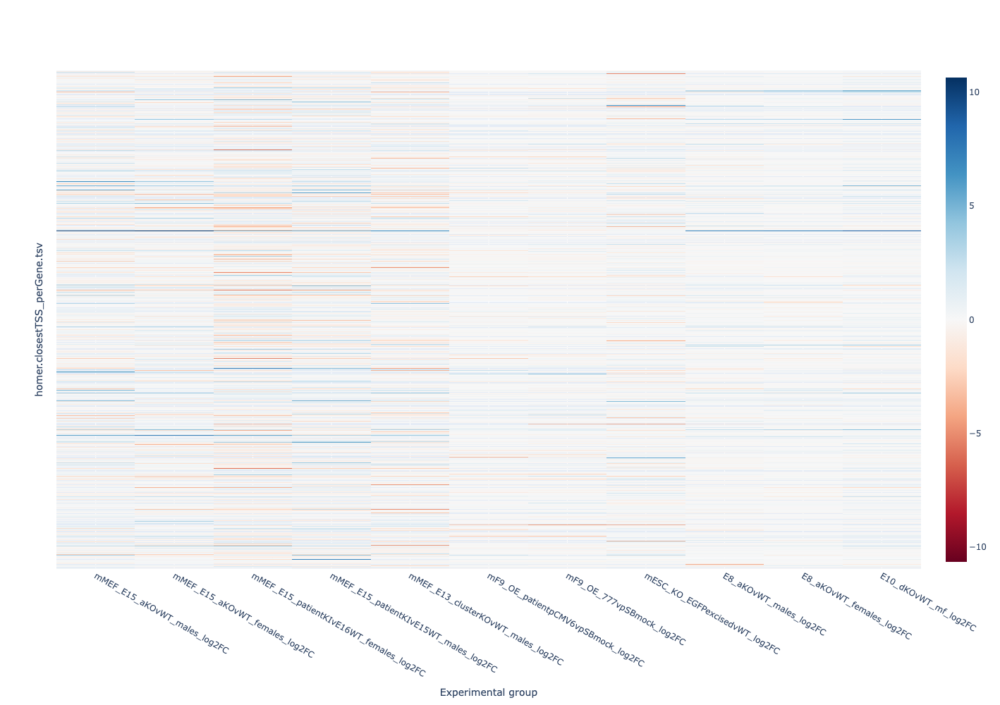

In [72]:
import plotly.graph_objects as go

log2fc_cols = [c for c in df.columns if c != "geneName"]

z = df[log2fc_cols].to_numpy()

fig = go.Figure(
    data=go.Heatmap(
        z=z,
        x=log2fc_cols,
        y=df["geneName"],
        zmid=0,  # center colors around 0
        hovertemplate="Gene=%{y}<br>Group=%{x}<br>log2FC=%{z}<extra></extra>",
        colorscale='RdBu'
    )
)

fig.update_yaxes(showticklabels=False)

fig.update_layout(
    xaxis_title="Experimental group",
    yaxis_title="homer.closestTSS_perGene.tsv",
    height=1000,
    width=500
)

fig.show()


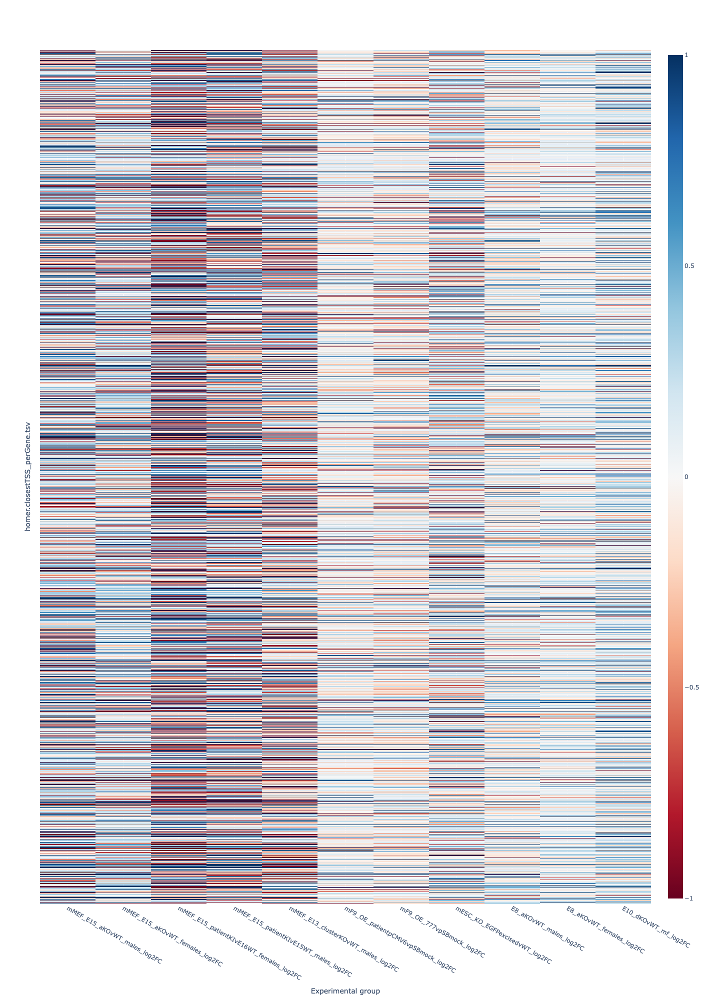

In [74]:
fig = go.Figure(
    go.Heatmap(
        z=df[log2fc_cols].to_numpy(),
        x=log2fc_cols,
        y=df["geneName"],
        zmin=-1,
        zmax=1,
        zmid=0,
        hovertemplate="Gene=%{y}<br>Group=%{x}<br>log2FC=%{z}<extra></extra>",
         colorscale='RdBu'
    )
)

fig.update_yaxes(showticklabels=False)

fig.update_layout(
    xaxis_title="Experimental group",
    yaxis_title="homer.closestTSS_perGene.tsv",
    height=2000,
    width=1000
)
fig.show()
